# Детекция

* Постановка задачи
* Датасеты
* Метрики
* Детекторы

## Постановка задачи

Что такое детекция объектов? <br>
Судя по названию мы должны найти некий объект на изображении. Но что означает найти объект? <br>
В задачи классификации нам было достаточно сказать, что на картинке есть объект опредленного класса. <br>  Например, классификатор сказал бы, скорее всего, что на картинке ниже котик.

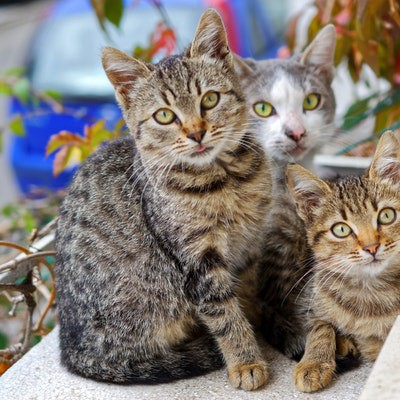

**Object Detection**

Теперь помимо классификации нам интересно еще найти объект на изображении. При том мы хотим уметь находить все объекты, относящиеся к заданным классам. Найти объект это значит найти такой минимальный прямоугольник, который будет вмещать в себя объект целиком. То есть для каждого котика на изображении мы хотим знать, что это котик, и координаты прямоугольника, описывающего нашего котика.

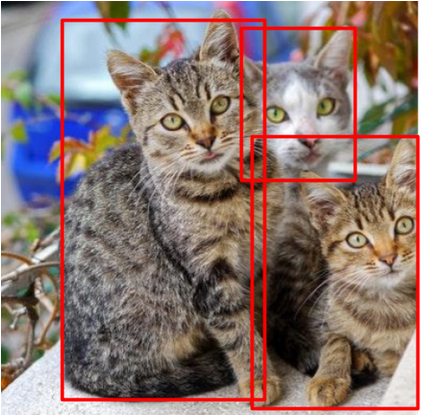

Мы хотим иметь такой алгоритм, который принимает на вход изображение.

На выходе получаем набор так называемых bounding box-ов, каждый из которых содержит следующую информацию:

- координаты объекта
- class -- имя класса
- confidence вероятность данного класса

Для того, чтобы определить прямоугольник нам хватит всего 4 числа. Но они могут быть в различных форматах:
- (Cx, Cy, h, w)
- (x_tl, y_tl, x_rb, y_rb)

иногда даже
- (y_tl, x_tl, y_rb, x_rb) (for example, in TF Object Detection API)

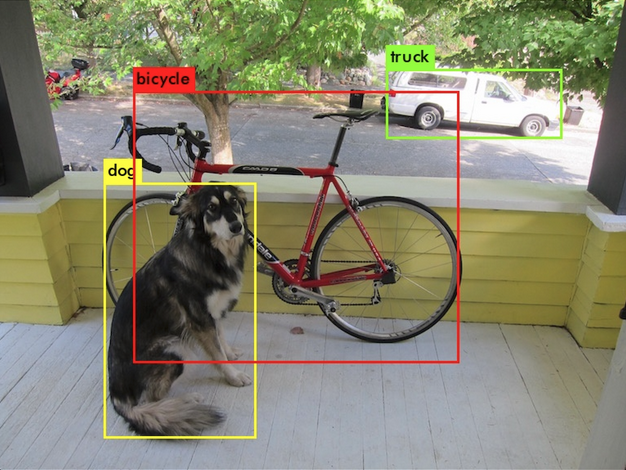

## Датасеты


### Pascal VOC

[Pascal VOC 2012](http://host.robots.ox.ac.uk/pascal/VOC/)

[Cтатья](http://host.robots.ox.ac.uk/pascal/VOC/pubs/everingham15.pdf)

Датасет содержит:
* 20 классов
* Набор train + val содержит 11,530 картинок, 27,450 ROI  и 6,929 сегментационных масок.
* Картинки различных размеров и качества





<img src="https://i.ibb.co/hFHww84/Screenshot-61.png" height="300" width="500">
<img src="https://i.ibb.co/ZHXxT93/Screenshot-62.png" height="300" width="700">

### MS-COCO Common Objects in Context


[Сайт](https://cocodataset.org/) датасета.

[Статья](https://arxiv.org/abs/1405.0312)

Датасет содержит:
* 80 классов
* Train: 118K (18GB) картинок
* Val: 5K (1GB) картинок
* Test: 41K (6GB) картинок



<img src="https://i.ibb.co/ZJzdy3d/Screenshot-63.png" height="700" width="900">

### LVIS

[LVIS](https://www.lvisdataset.org/)

[Статья](https://arxiv.org/abs/1908.03195)

Содержит:
* Train 100,170 изображений
* Val 19,809 изображений
* Val 19,809 изображений
* 1204 класса

<img src="https://i.ibb.co/T2TkYSZ/lvis.png" alt="lvis" border="0">


### ImageNet
[Ссылка](https://image-net.org/) на датасет

[Ссылка](http://image-net.org/download-bboxes) на данные для задачи детекции

[Статьи](http://image-net.org/about-publication).


Датасет содержит:
* 200 классов
* Train + Val сожержат 400,000 изображений,
* Примерно 350,000 bounding boxes

<img src="https://i.ibb.co/f845JRQ/Screenshot-64.png" height="500" width="600">

### OpenImages

[Сайт](https://storage.googleapis.com/openimages/web/index.html) датасета.


Датасет содержит:
* 600 классов
* Train 1,7M изображений
* Validation 41K изображений
* Test 125K изображений

<img src="https://i.ibb.co/CwQXtTs/Open-Images.png" height="350" width="700">

Классы в датасете имеют иерархическую структуру. Визуализацию можно посмотреть [здесь](https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy_visualizer/circle.html).

Описание датасета [здесь](https://storage.googleapis.com/openimages/web/factsfigures.html)

Для конкретной задачи намного лучше использовать специально собранный датасет. Их существует намного больше, чем приведено выше. Эти самые популярные для создания предобученных моделей.

---

## Метрики

### IoU

Для подсчета данной метрики нам необъодимо взять два bounding box-а. Посчитаем площадь объединениея, площадь пересечения и возьмем отношение площади пересечения к площади объединения. Это и есть IoU.

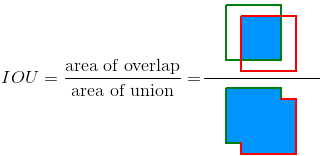

In [3]:
!git clone https://github.com/AlexeyRogS/cv_course

/bin/bash: line 1: cd: cv_course/week4: No such file or directory
Cloning into 'cv_course'...
remote: Enumerating objects: 216, done.
remote: Counting objects: 100% (34/34), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 216 (delta 7), reused 22 (delta 5), pack-reused 182
Receiving objects: 100% (216/216), 97.17 MiB | 28.37 MiB/s, done.
Resolving deltas: 100% (40/40), done.


In [25]:
import os
import cv2
import numpy as np
import ipywidgets as widgets
import matplotlib.pyplot as plt

In [5]:
def area(bbox):
    return (bbox[2] - bbox[0]) * (bbox[3] - bbox[1])

def intersection(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    if x1 > x2 or y1 > y2:
        return None
    return np.array([x1, y1, x2, y2])

def IoU(box1, box2):
    inter_box = intersection(box1, box2)
    if inter_box is None:
        return 0
    inter = area(inter_box)
    iou = inter / (area(box1) + area(box2) - inter)
    return iou

In [9]:
def update_plot(x, y, size):
    img = np.zeros((512, 512, 3), dtype="uint8")

    bbox_1 = np.array([0, 0, 255, 255])
    bbox_2 = np.array([x, y, x + size, y + size])
    intersect = intersection(bbox_1, bbox_2)
    if intersect is not None:
        cv2.rectangle(img, intersect[:2], intersect[2:], (155, 0, 155), -1)
    cv2.rectangle(img, bbox_1[:2], bbox_1[2:], (255, 0, 0), 3)
    cv2.rectangle(img, bbox_2[:2], bbox_2[2:], (0, 0, 255), 3)
    iou_value = IoU(bbox_1, bbox_2)

    cv2.putText(img, f'IOU = {iou_value:.2f}', (300, 25), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 3)
    plt.figure(figsize=(4, 4))
    plt.imshow(img)
    plt.show()

x = widgets.IntSlider(min=0, max=300, value=0, description='x:')
y = widgets.IntSlider(min=0, max=300, value=0, description='y:')
size = widgets.IntSlider(min=1, max=255, value=255, description='size:')

widgets.interactive(update_plot, x=x, y=y, size=size)

interactive(children=(IntSlider(value=0, description='x:', max=300), IntSlider(value=0, description='y:', max=…

Если бы мы детектили всегда только один объект на изображении, то нам было бы очень легко применять данную метрику. Но практически всегда нам необъодимо детектить неопределенное количество объектов на изображении. Поэтому нам нужна такая метрика, которая будет описывать качество детекций.

Очевидно, что чем выше IoU, тем более совпадают прямоугольники.
Давайте теперь будем считать, что у нас есть прямоугольник из разметки (ground truth), и предсказанный при помощи какой-то модели bounding box.

Зафиксируем порог IoU, например, 0.5.

Тогда возможны следующие ситуации:

**True Positive (TP)**: Правильное предсказание. IOU ≥ threshold (0.5 в нашем случае)

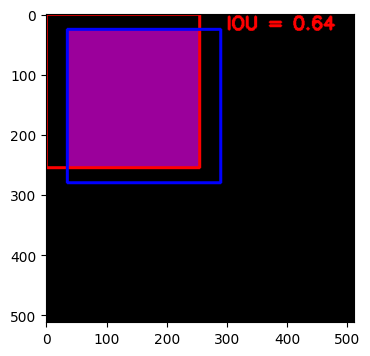

In [13]:
update_plot(35, 25, 255)

**False Positive (FP)**: Неправильное предсказание. Detection with IOU < threshold (0.5 в нашем случае). В случае рельной работы также False Positive будет bounding box с неправильным классом.

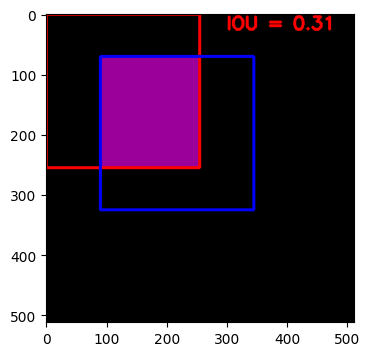

In [14]:
update_plot(90, 70, 255)

**False Negative (FN)**: не задетектили ground truth бокс.

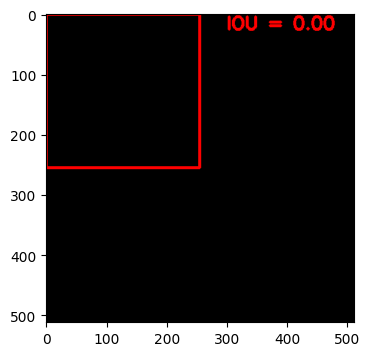

In [15]:
update_plot(1000, 1000, 255)

### Precision and Recall

[Confusion matrix](https://en.wikipedia.org/wiki/Confusion_matrix)

<img src="https://i.ibb.co/T83hFN1/Screenshot-60.png" height="250" width="580">

Precision - это процент правильных детекций из всех детекций, который определяется по формуле:

\begin{align}
Precision = \frac{TP}{TP + FP}
\end{align}


Recall - это процент правильных детекций, обнаруженных среди всех размеченных данных.

\begin{align}
Recall = \frac{TP}{TP + FN}
\end{align}


F1 score

\begin{align}
F_1 = 2\frac{P * R}{P + R}
\end{align}


Кривая **Precision / Recall** - хороший способ оценить качество работы детектора. <br>
Детектор объектов считается хорошим, если его ***Precision*** остается высокой по мере увеличения ***Recall***, а это означает, что если вы измените confidence, точность и отзыв будут по-прежнему высокими.


![](https://blog.zenggyu.com/static/posts/en/2018-12-16-an-introduction-to-evaluation-metrics-for-object-detection/fig_1.gif)

In [26]:
import torch
from torch.utils.data import Dataset

class CustomImageDataset(Dataset):
    def __init__(self, gt_boxes):
        self.boxes = gt_boxes  # dict

    def __len__(self):
        return len(self.boxes)

    def __getitem__(self, idx):
        image = torch.ones((3, 224, 224))
        label = {
            "image_id": idx,
            "boxes": torch.tensor(self.boxes[idx], dtype=torch.float32),
            "labels": torch.tensor([1 for _ in range(len(self.boxes[idx]))]),
            "area": torch.tensor([(box[2]-box[0])*(box[3]-box[1]) for box in self.boxes[idx]], dtype=torch.float32),
            "iscrowd": torch.tensor([0 for _ in range(len(self.boxes[idx]))]),
        }
        return image, label

In [49]:
def drow_rects(x, preds=None, ax=None):
    img, label = x
    img = img.detach().cpu().numpy()
    img = np.transpose(img, axes=(1, 2, 0))
    img = img.astype(np.uint8).copy()
    for box in label["boxes"]:
        box = box.detach().cpu().numpy().astype(int)
        cv2.rectangle(img, box[:2], box[2:], (0, 255, 0), 2)
    if preds is not None:
        if isinstance(box, torch.Tensor):
            box = box.detach().cpu().numpy().astype(int)
        else:
            box = box.astype(int)
        for box, name in zip(preds["boxes"], preds["names"]):
            cv2.rectangle(img, box[:2], box[2:], (255, 0, 0), 2)
            cv2.putText(img, name, box[:2], cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

    if ax is None:
        plt.figure(figsize=(4, 4))
        plt.imshow(img[:,:,::-1])
        plt.axis("off")
    else:
        ax.imshow(img[:,:,::-1])
        ax.axis("off")

In [42]:
import json
from cv_course.week4.utils.coco_utils import convert_to_coco_api
from cv_course.week4.utils.coco_eval import CocoEvaluator

In [46]:
with open("cv_course/week4/data/labels.json", "r") as f:
    bboxes = {int(k): v for k, v in json.loads(f.read()).items()}
with open("cv_course/week4/data/predictions.json", "r") as f:
    predictions = {int(k): v for k, v in json.loads(f.read()).items()}
ds = CustomImageDataset(bboxes)

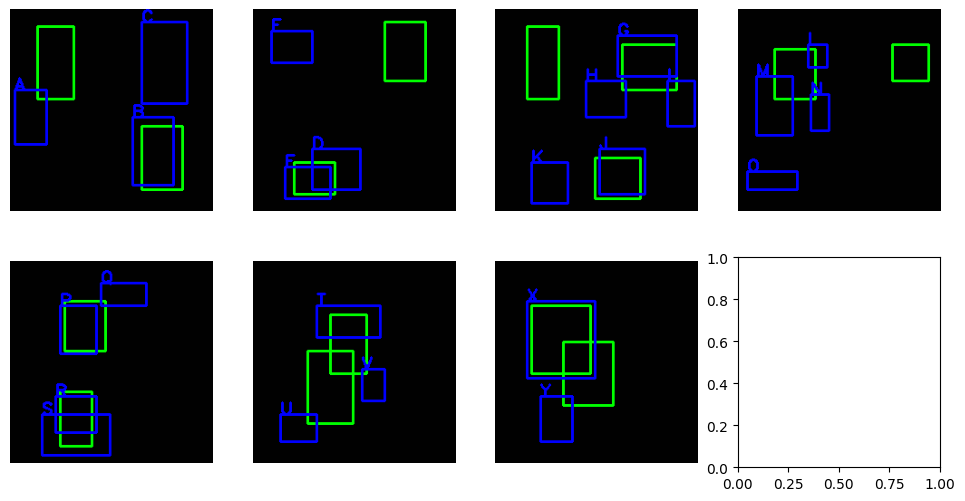

In [50]:
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 6))
for i in bboxes:
    drow_rects(ds[i], preds=predictions[i], ax=axes[i//4,i%4])

In [53]:
def compute_stats(gt, pred, IoU_th=0.5):
    stats = []
    N = 0
    for image_id in gt:
        N += len(gt[image_id])
    pred_ = []
    for image_id, predictions in pred.items():
        for box, score, label, name in zip(predictions["boxes"], predictions["scores"], predictions["labels"], predictions["names"]):
            pred_.append([image_id, box, score, label, name])
    pred_ = sorted(pred_, key=lambda x: -x[2])

    found_gt = {image_id: np.zeros(len(gt[image_id])) for image_id in gt}
    N = 0
    for _, v in gt.items():
        N += len(v)
    found = 0
    for image_id, box, score, label, name in pred_:
        gt_boxes = gt[image_id]
        ious = [IoU(box, gt_box) for gt_box in gt_boxes]
        max_iou_index = np.argmax(ious)
        if ious[max_iou_index] <= IoU_th or found_gt[image_id][max_iou_index] == 1:
            stats.append([ious[max_iou_index], score, name, 0, 1, N-found])
        else:
            found += 1
            found_gt[image_id][max_iou_index] = 1
            stats.append([ious[max_iou_index], score, name, 1, 0, N-found])
    return stats

In [54]:
import pandas as pd
stats = pd.DataFrame(compute_stats(bboxes, predictions),
                     columns=["iou", "conf", "name", "tp", "fp", "accum_fn"])
stats["accum_tp"] = np.cumsum(stats["tp"])
stats["accum_fp"] = np.cumsum(stats["fp"])
stats["precision"] = stats["accum_tp"] / (stats["accum_tp"] + stats["accum_fp"])
stats["recall"] = stats["accum_tp"] / (stats["accum_tp"] + stats["accum_fn"])
stats

,iou,conf,name,tp,fp,accum_fn,accum_tp,accum_fp,precision,recall
0,0.560000,0.95,R,1,0,14,1,0,1.000000,0.066667
1,0.018182,0.95,Y,0,1,14,1,1,0.500000,0.066667
2,0.610169,0.91,J,1,0,13,2,1,0.666667,0.133333
3,0.019231,0.88,A,0,1,13,2,2,0.500000,0.133333
4,0.019608,0.84,U,0,1,13,2,3,0.400000,0.133333
5,0.000000,0.80,C,0,1,13,2,4,0.333333,0.133333
6,0.109290,0.78,M,0,1,13,2,5,0.285714,0.133333
7,0.000000,0.74,F,0,1,13,2,6,0.250000,0.133333
8,0.233645,0.71,D,0,1,13,2,7,0.222222,0.133333
9,0.535294,0.70,B,1,0,12,3,7,0.300000,0.200000


In [100]:
def prec_inter(recall, precision, r):
    mask = recall[None,:] > r[:,None]
    prec = np.where(mask, np.tile(precision, reps=(mask.shape[0], 1)), np.zeros_like(mask))
    return np.max(prec, axis=1)

In [97]:
def interp(recall, precision, N=11):
    recall = np.concatenate([recall, [1]])
    precision = np.concatenate([precision, [0]])
    result = []
    for r_i in range(N):
        r = r_i / (N - 1)
        mask = recall >= r
        result.append(max(precision[mask]))
    return [i / (N - 1) for i in range(N)], result

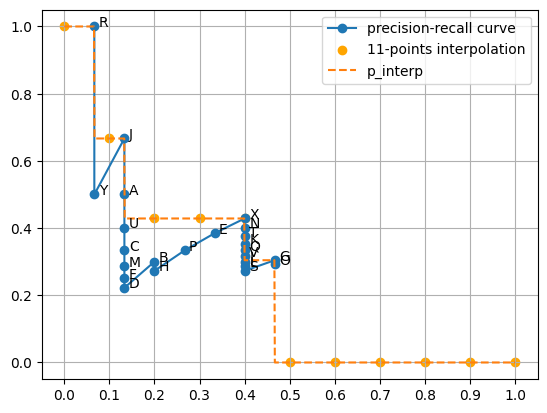

In [110]:
r_int, p_int = interp(stats["recall"], stats["precision"], N=11)
plt.plot(stats["recall"], stats["precision"], 'o-', label='precision-recall curve')
plt.scatter(r_int, p_int, label='11-points interpolation', c='orange')

for i in range(stats.shape[0]):
    plt.annotate(stats["name"][i], (stats["recall"][i]+0.01, stats["precision"][i]))

recall_interp = np.linspace(0, 1, 1001)
precision_interp = prec_inter(stats["recall"].values, stats["precision"].values, recall_interp)
plt.plot(recall_interp, precision_interp, '--', label='p_interp')
plt.legend()
plt.xticks([r / 10 for r in range(11)])
plt.grid()
plt.show()

### Average Precision

Данная метрика появилась в соревновании PASCAL VOC. Подробнее можно почитать в [статье](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.157.5766&rep=rep1&type=pdf).

$$AP=\frac{1}{11}\sum_{r\in\{0,0.1,\cdots,1\}}p_{interp}(r)\approx\frac{1}{11}(1+0.6667+0.4286+0.4286+4286+0+0+0+0+0+0)=≈0.2684=26.84\%$$

### Проверим правильность на методе из библиотеки

In [111]:
coco_evaluator = CocoEvaluator(convert_to_coco_api(ds), ['bbox'])
res = dict()
for image_id in bboxes:
    pred = predictions[image_id]
    pred = {
        "boxes": torch.tensor(pred["boxes"], dtype=torch.float32),
        "scores": torch.tensor(pred["scores"], dtype=torch.float32),
        "labels": torch.tensor(pred["labels"]),
    }
    res[image_id] = pred
coco_evaluator.update(res)
# coco_evaluator.synchronize_between_processes()
coco_evaluator.accumulate()
coco_evaluator.summarize()

creating index...
index created!
Accumulating evaluation results...
DONE (t=0.01s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.050
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.248
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.050
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.033
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.120
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.120
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.120
 Average Recall 

In [112]:
r_int, p_int = interp(stats["recall"], stats["precision"], N=101)
np.mean(p_int)

0.24816021974868288

### COCO mAP

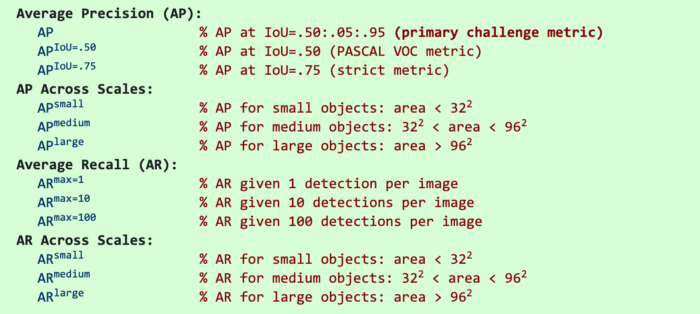

---

## Детекторы

Так или иначе все модели используют следующие основные идеи:

* Делаем некоторые предположения насчет распределения bounding box-ов

* Используем задачу регресси для уточнения координат боксов

* Используем классификацию для определения класса объекта

* На выходе мы можем получить много боксов, и нам надо их научиться фильтровать. Обычно это делается при помощи алгоритма NMS.



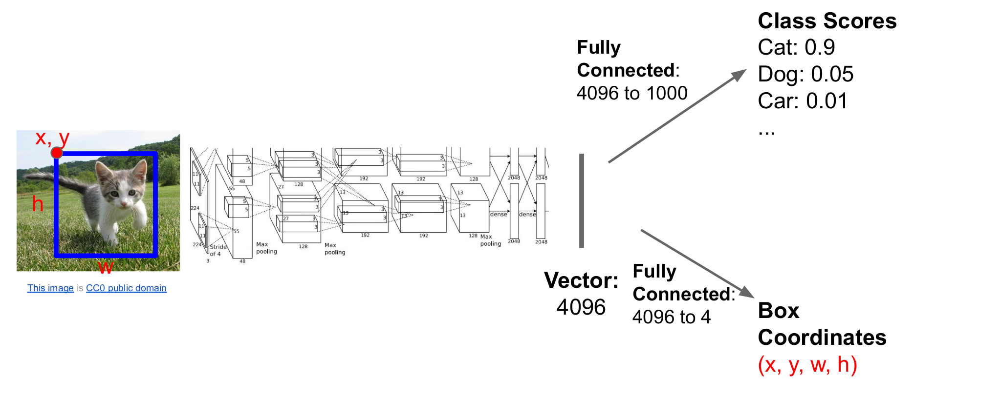

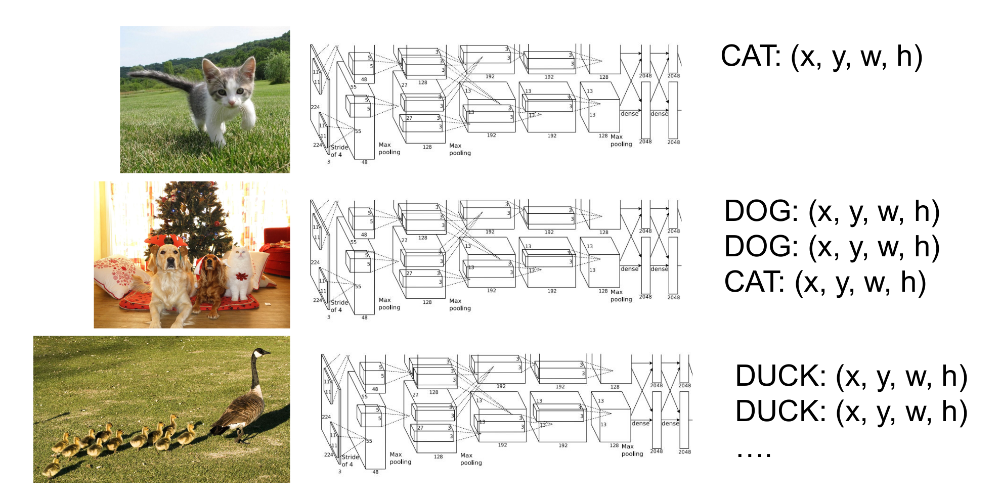

Мы с вами уже умеем классифицировать изображения. Давайте представим, как бы мы могли решить задачу детекции при помощи классификатора.

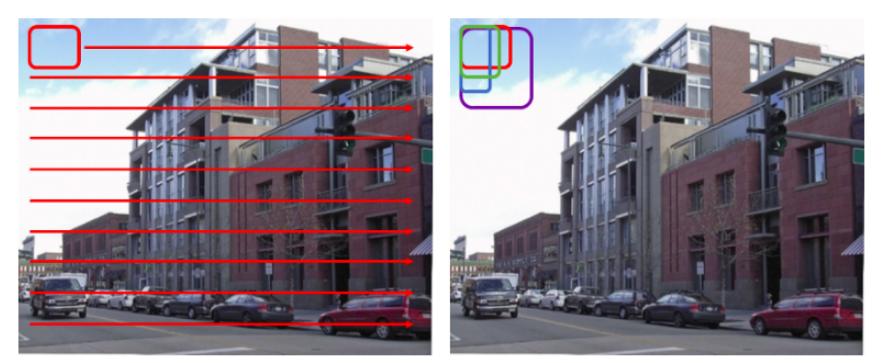

### R-CNN

Данный детектор имеет два основных шага:

Шаг 1:

- Вначале мы при помощи алгоритма selective search находим потенциальные регионы, где может быть объект.

- Выравниваем их до одного размера, чтобы обработать дальше.

Шаг 2:

* Для каждого изображения запускаем модельку, которая извлекает фичи, на основе них предсказывает классы и координаты объекта.

И заключительный шаг - постпроцессинг (убираем сильно пересекающиеся объекты)

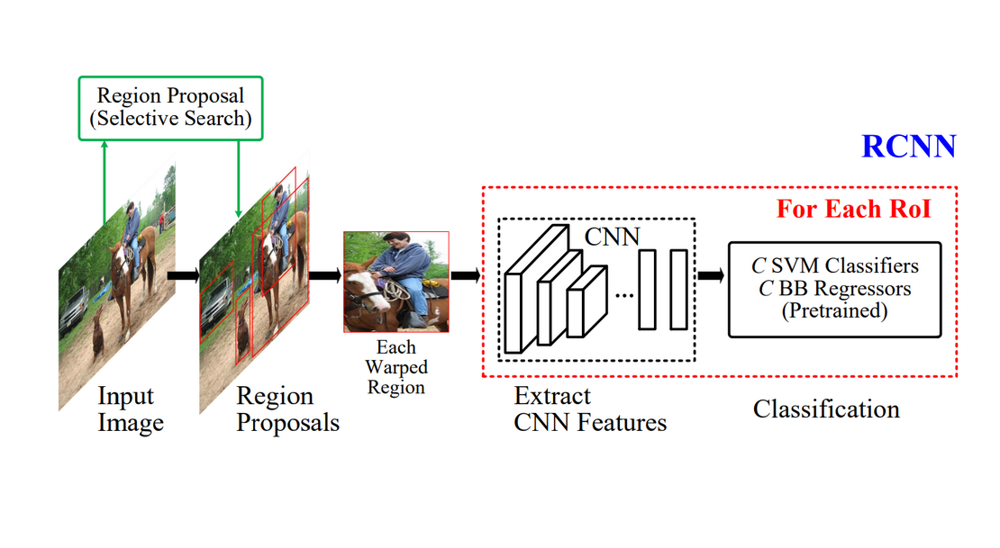

### Fast R-CNN

Данный детектор имеет два основных шага:

Шаг 1:

- Вначале мы при помощи алгоритма selective search находим потенциальные регионы, где может быть объект.

- Один раз запускаем модельку на всем изображении, получаем feature map.

- Делаем магический шаг ROI Pulling.

Шаг 2:

- Предсказываем классы и боксы уже на результатах после шага ROI Pulling.


И заключительный шаг - постпроцессинг (убираем сильно пересекающиеся объекты)

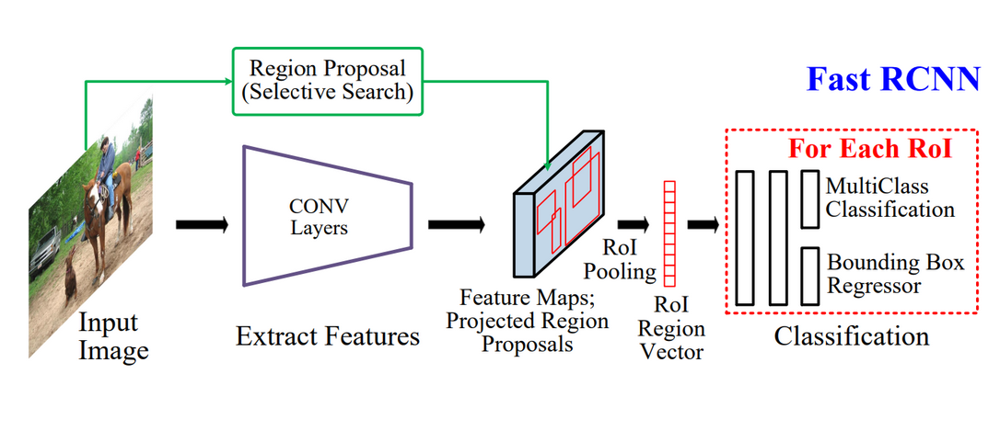

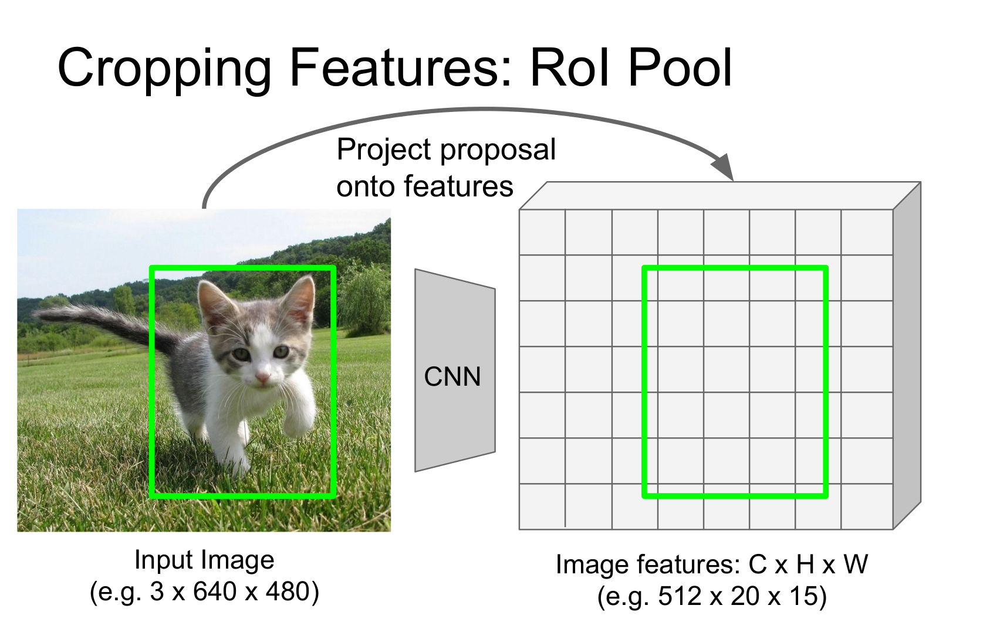

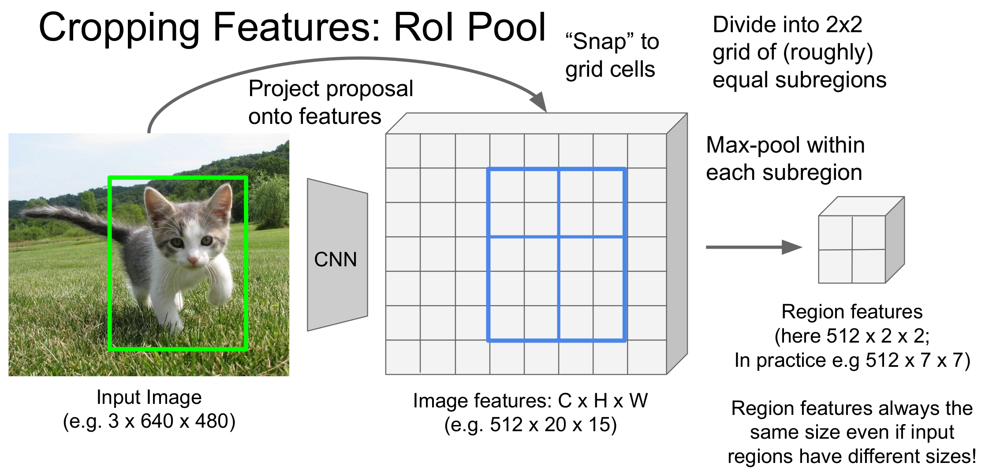

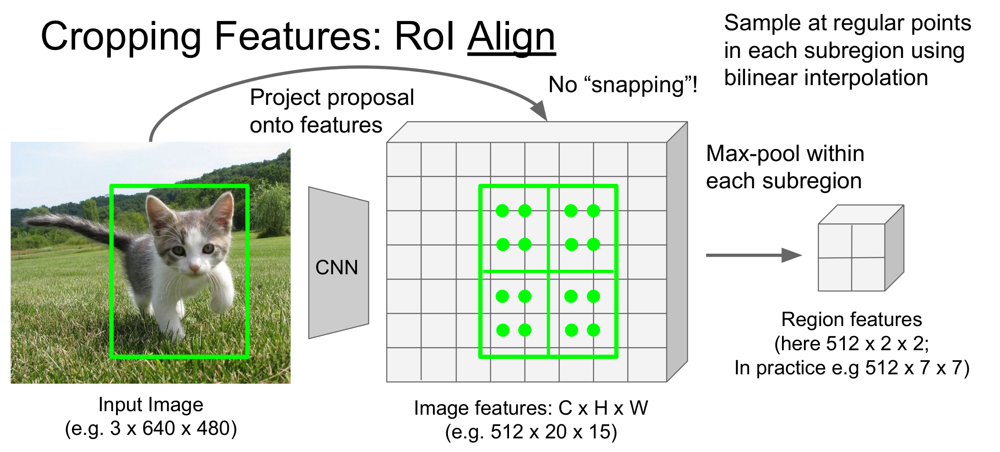

[Пост](https://erdem.pl/2020/02/understanding-region-of-interest-part-2-ro-i-align), который поможет разобраться.

### Faster R-CNN

Все то же самое, только выкинули Selective Search и добавили вместо этого еще одну сетку.

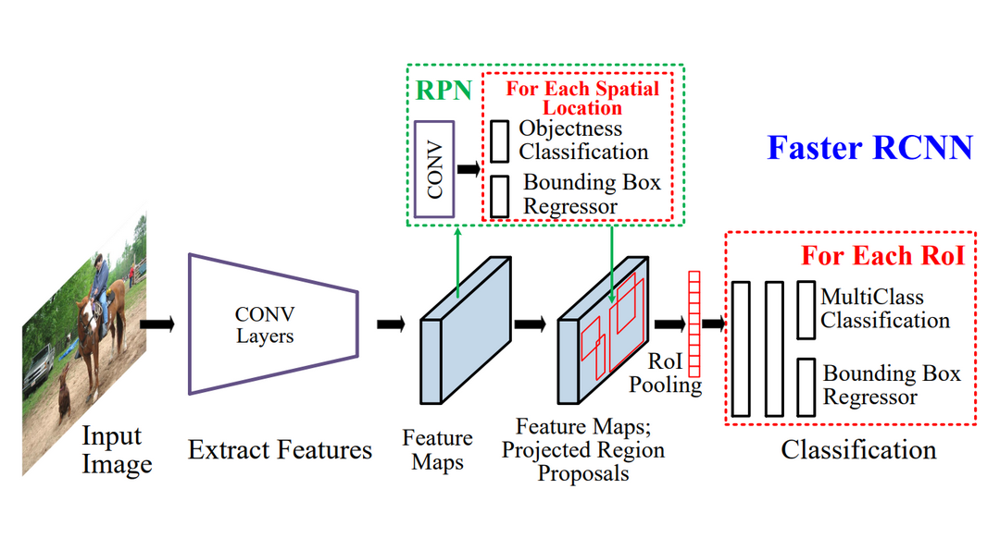

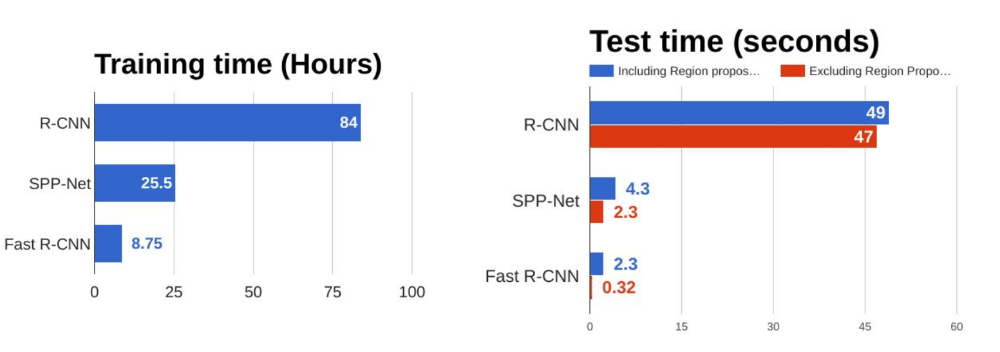

### Mask R-CNN

Давайте еще добавим предсказание масок!

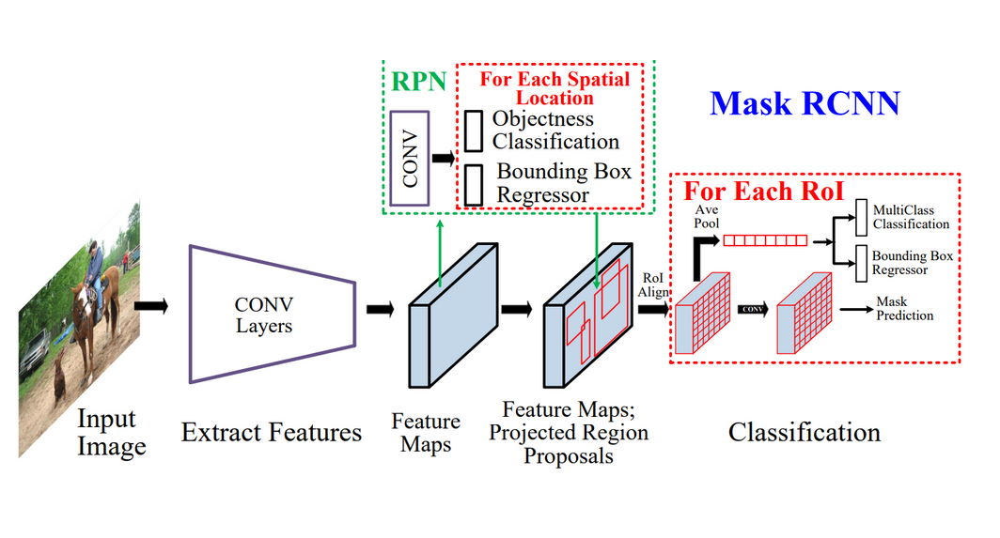

## One stage detectors

### YOLO

[You only look once](https://arxiv.org/pdf/1506.02640.pdf).

Это целое семейство моделей для детекции объектов. Существует несколько версий YOLO. Изначально они все были доступны на [этом](https://pjreddie.com/darknet/yolo/) сайте.

Затем последние версии YOLO перекочевали в [данный](https://github.com/AlexeyAB/darknet) репозиторий.

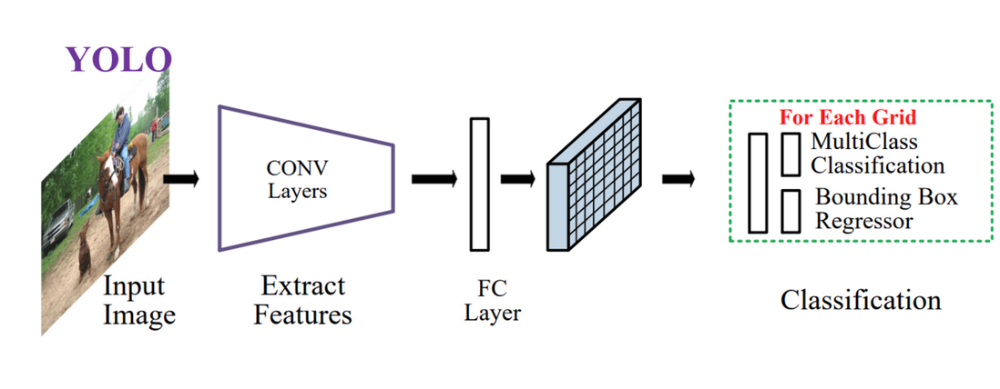

![](https://github.com/AlexeyRogS/cv_course/blob/week4/week4/imgs/yolo.png?raw=1)

### SSD

Single shot detector.

[Ссылка](https://arxiv.org/pdf/1512.02325.pdf) на статью.

[Хороший разбор](https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Object-Detection).

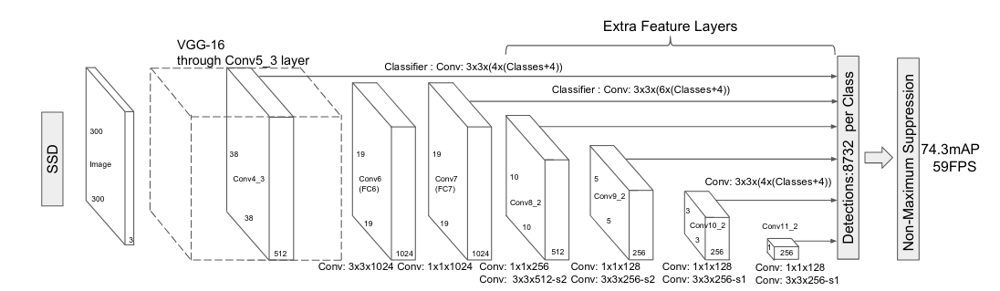

SSD работает следующим образом:

* На вход принимается изображение (H, W, 3)
* Далее при помощи так называемой Backbone части мы получаем feature map.
* Далее из feature map мы предсказываем уже координаты боксов и классы.

![](https://github.com/AlexeyRogS/cv_course/blob/week4/week4/imgs/yolo_ssd.png?raw=1)

[Источник](http://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture11.pdf).

## NMS

Данный алгоритм позволяет удалить лишние боксы для одного и того же объекта. По сути он оставляет детекцию с наибольшей уверенностью и удаляет остальные, если они пересекаются с ним достаточно сильно.

Подробнее почитать можно [здесь](https://towardsdatascience.com/non-maximum-suppression-nms-93ce178e177c).

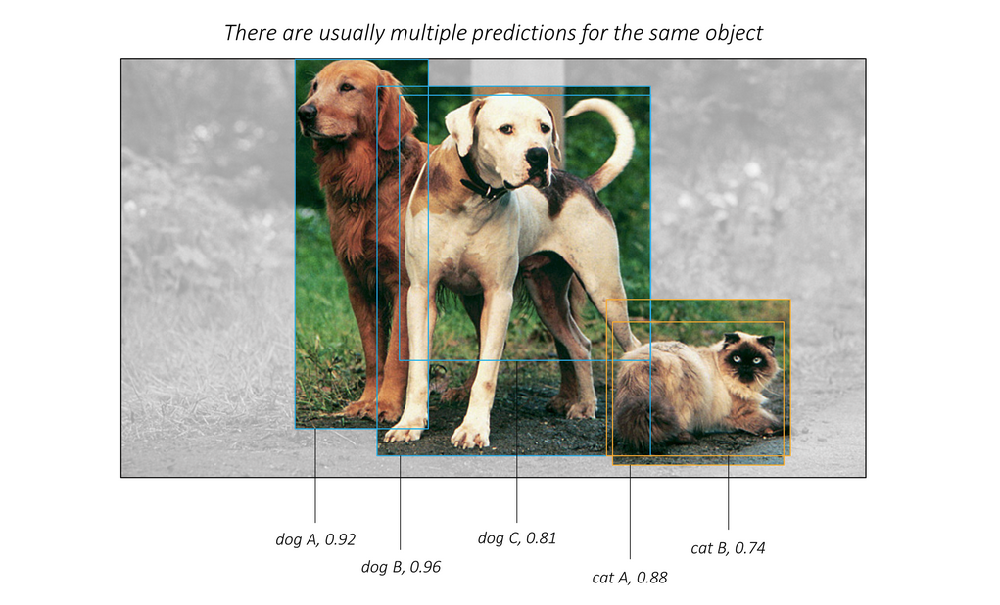

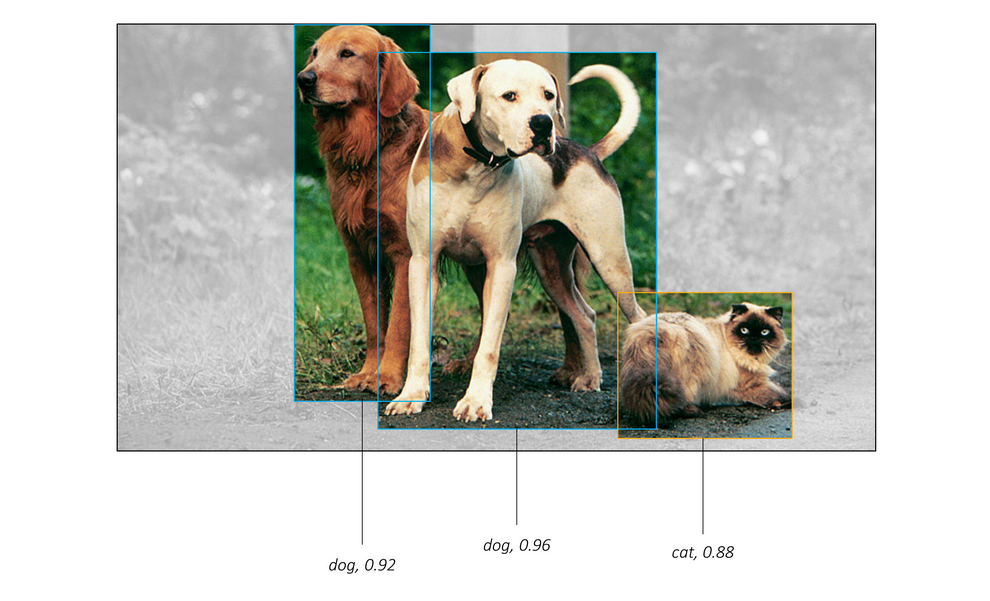

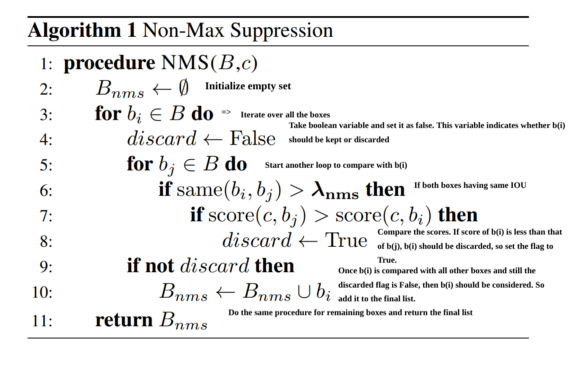

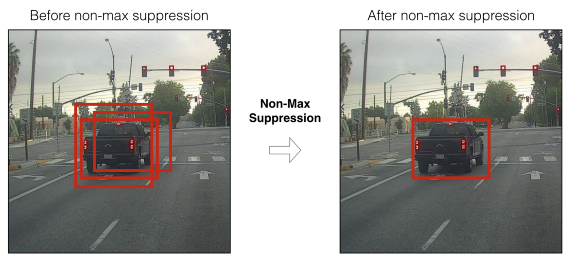

---

In [119]:
!wget https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
!unzip -q PennFudanPed.zip -d ./data

--2023-11-06 01:33:27--  https://www.cis.upenn.edu/~jshi/ped_html/PennFudanPed.zip
Resolving www.cis.upenn.edu (www.cis.upenn.edu)... 158.130.69.163, 2607:f470:8:64:5ea5::d
Connecting to www.cis.upenn.edu (www.cis.upenn.edu)|158.130.69.163|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 53723336 (51M) [application/zip]
Saving to: ‘PennFudanPed.zip’

PennFudanPed.zip    100%[===================>]  51.23M   154MB/s    in 0.3s    

2023-11-06 01:33:28 (154 MB/s) - ‘PennFudanPed.zip’ saved [53723336/53723336]



In [113]:
from torchvision.io import read_image
from torchvision.ops.boxes import masks_to_boxes
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F


class PennFudanDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms):
        self.root = root
        self.transforms = transforms
        # load all image files, sorting them to
        # ensure that they are aligned
        self.imgs = list(sorted(os.listdir(os.path.join(root, "PNGImages"))))
        self.masks = list(sorted(os.listdir(os.path.join(root, "PedMasks"))))

    def __getitem__(self, idx):
        # load images and masks
        img_path = os.path.join(self.root, "PNGImages", self.imgs[idx])
        mask_path = os.path.join(self.root, "PedMasks", self.masks[idx])
        img = read_image(img_path)
        mask = read_image(mask_path)
        # instances are encoded as different colors
        obj_ids = torch.unique(mask)
        # first id is the background, so remove it
        obj_ids = obj_ids[1:]
        num_objs = len(obj_ids)

        # split the color-encoded mask into a set
        # of binary masks
        masks = (mask == obj_ids[:, None, None]).to(dtype=torch.uint8)

        # get bounding box coordinates for each mask
        boxes = masks_to_boxes(masks)

        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)

        image_id = idx
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # suppose all instances are not crowd
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        # Wrap sample and targets into torchvision tv_tensors:
        img = tv_tensors.Image(img)

        target = {}
        target["boxes"] = tv_tensors.BoundingBoxes(boxes, format="XYXY", canvas_size=F.get_size(img))
        target["masks"] = tv_tensors.Mask(masks)
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            img, target = self.transforms(img, target)

        return img, target

    def __len__(self):
        return len(self.imgs)

In [114]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# load a model pre-trained on COCO
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")

# replace the classifier with a new one, that has
# num_classes which is user-defined
num_classes = 2  # 1 class (person) + background
# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features
# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

In [115]:
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(weights="DEFAULT").features
# ``FasterRCNN`` needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280

# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios
anchor_generator = AnchorGenerator(
    sizes=((32, 64, 128, 256, 512),),
    aspect_ratios=((0.5, 1.0, 2.0),)
)

# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be [0]. More generally, the backbone should return an
# ``OrderedDict[Tensor]``, and in ``featmap_names`` you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(
    featmap_names=['0'],
    output_size=7,
    sampling_ratio=2,
)

# put the pieces together inside a Faster-RCNN model
model = FasterRCNN(
    backbone,
    num_classes=2,
    rpn_anchor_generator=anchor_generator,
    box_roi_pool=roi_pooler,
)

In [116]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor


def get_model_instance_segmentation(num_classes):
    # load an instance segmentation model pre-trained on COCO
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

    # get number of input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace the pre-trained head with a new one
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # now get the number of input features for the mask classifier
    in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    hidden_layer = 256
    # and replace the mask predictor with a new one
    model.roi_heads.mask_predictor = MaskRCNNPredictor(
        in_features_mask,
        hidden_layer,
        num_classes,
    )

    return model

In [117]:
from torchvision.transforms import v2 as T


def get_transform(train):
    transforms = []
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    transforms.append(T.ToDtype(torch.float, scale=True))
    transforms.append(T.ToPureTensor())
    return T.Compose(transforms)

In [120]:
import utils


model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")
dataset = PennFudanDataset('data/PennFudanPed', get_transform(train=True))
data_loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=2,
    shuffle=True,
    num_workers=4,
    collate_fn=utils.collate_fn
)

# For Training
images, targets = next(iter(data_loader))
images = list(image for image in images)
targets = [{k: v for k, v in t.items()} for t in targets]
output = model(images, targets)  # Returns losses and detections
print(output)

# For inference
model.eval()
x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
predictions = model(x)  # Returns predictions
print(predictions[0])

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


{'loss_classifier': tensor(0.2341, grad_fn=<NllLossBackward0>), 'loss_box_reg': tensor(0.0741, grad_fn=<DivBackward0>), 'loss_objectness': tensor(0.0400, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>), 'loss_rpn_box_reg': tensor(0.0115, grad_fn=<DivBackward0>)}
{'boxes': tensor([], size=(0, 4), grad_fn=<StackBackward0>), 'labels': tensor([], dtype=torch.int64), 'scores': tensor([], grad_fn=<IndexBackward0>)}


In [121]:
from cv_course.week4.utils.engine import train_one_epoch, evaluate

# train on the GPU or on the CPU, if a GPU is not available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# our dataset has two classes only - background and person
num_classes = 2
# use our dataset and defined transformations
dataset = PennFudanDataset('data/PennFudanPed', get_transform(train=True))
dataset_test = PennFudanDataset('data/PennFudanPed', get_transform(train=False))

# split the dataset in train and test set
indices = torch.randperm(len(dataset)).tolist()
dataset = torch.utils.data.Subset(dataset, indices[:-50])
dataset_test = torch.utils.data.Subset(dataset_test, indices[-50:])

# define training and validation data loaders
data_loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=2,
    shuffle=True,
    num_workers=4,
    collate_fn=utils.collate_fn
)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test,
    batch_size=1,
    shuffle=False,
    num_workers=4,
    collate_fn=utils.collate_fn
)

# get the model using our helper function
model = get_model_instance_segmentation(num_classes)

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

# and a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)

# let's train it for 5 epochs
num_epochs = 5

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, data_loader_test, device=device)

print("That's it!")

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


KeyboardInterrupt: ignored

[Советую попробовать в связке с W&B.](https://wandb.ai/manan-goel/yolox-nano/reports/Tracking-your-YOLOX-Runs-with-Weights-Biases---VmlldzoxNzc0NjA0)

---

## Ссылки

Статья на хабре про YoloV4: https://habr.com/ru/post/503200/

Статья на arxiv про YoloV4: https://arxiv.org/pdf/2004.10934.pdf

Статья на arxiv про Fast R-CNN: https://arxiv.org/pdf/1504.08083.pdf

Статья на arxiv про SSD: https://arxiv.org/pdf/1512.02325.pdf

Оригинальный сайт YOLO: https://pjreddie.com/darknet/yolo/


Репозитории, достойные внимания:

Detectron2 (PyTorch):
https://github.com/facebookresearch/detectron2

TensorFlow Detection API:
https://github.com/tensorflow/models/tree/master/research/object_detection

YOLO: https://github.com/AlexeyAB/darknet

SSD explained: https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Object-Detection

mAP explained: https://github.com/rafaelpadilla/Object-Detection-Metrics

